In [ ]:
!pip install ultralytics

In [5]:
from ultralytics import YOLO
import easyocr
import cv2

In [2]:
# model object now gives us access to to methods like train() predict() and export()
model = YOLO("best.pt")

In [24]:
results = model.predict("test5.jpg") # this can take in multiple things - paths to images, an array of path of images, also PIL lib


image 1/1 c:\Nandana\Projects\Summer 2025\yolo-detection\test5.jpg: 640x480 1 butter, 1 corn, 6 milks, 1 spinach, 5 sugars, 267.0ms
Speed: 9.7ms preprocess, 267.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


In [25]:
result = results[0] # contains detected objects and convenient properties to work with them
bounding_boxes = len(result.boxes)
print(bounding_boxes) # 2 boxes detected - one for dog, one for cat

box = result.boxes[0]
print(box)

cords = box.xyxy[0].tolist() # boxes that are bounding the detected object
class_id = box.cls[0].item() # 
conf = box.conf[0].item()
print("Object type:", class_id) # Object type have numeric IDs - 80 object types 
print("Coordinates:", cords)
print("Probability:", conf)

14
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([27.])
conf: tensor([0.9209])
data: tensor([[2.2950e+03, 8.9468e+02, 2.7511e+03, 1.5213e+03, 9.2085e-01, 2.7000e+01]])
id: None
is_track: False
orig_shape: (4032, 3024)
shape: torch.Size([1, 6])
xywh: tensor([[2523.0664, 1208.0017,  456.0774,  626.6470]])
xywhn: tensor([[0.8343, 0.2996, 0.1508, 0.1554]])
xyxy: tensor([[2295.0276,  894.6782, 2751.1050, 1521.3252]])
xyxyn: tensor([[0.7589, 0.2219, 0.9098, 0.3773]])
Object type: 27.0
Coordinates: [2295.027587890625, 894.67822265625, 2751.10498046875, 1521.3251953125]
Probability: 0.920853316783905


In [17]:
# Different object types
print(result.names)
print(result.names[class_id])

{0: 'apple', 1: 'banana', 2: 'beef', 3: 'blueberries', 4: 'bread', 5: 'butter', 6: 'carrot', 7: 'cheese', 8: 'chicken', 9: 'chicken_breast', 10: 'chocolate', 11: 'corn', 12: 'eggs', 13: 'flour', 14: 'goat_cheese', 15: 'green_beans', 16: 'ground_beef', 17: 'ham', 18: 'heavy_cream', 19: 'lime', 20: 'milk', 21: 'mushrooms', 22: 'onion', 23: 'potato', 24: 'shrimp', 25: 'spinach', 26: 'strawberries', 27: 'sugar', 28: 'sweet_potato', 29: 'tomato'}
green_beans


In [26]:
for box in result.boxes:
  class_id = result.names[box.cls[0].item()]
  cords = box.xyxy[0].tolist()
  cords = [round(x) for x in cords]
  conf = round(box.conf[0].item(), 2)
  print("Object type:", class_id)
  print("Coordinates:", cords)
  print("Probability:", conf)
  print("---")

Object type: sugar
Coordinates: [2295, 895, 2751, 1521]
Probability: 0.92
---
Object type: milk
Coordinates: [2, 485, 450, 1067]
Probability: 0.92
---
Object type: milk
Coordinates: [1302, 3175, 1745, 3836]
Probability: 0.92
---
Object type: sugar
Coordinates: [1163, 1016, 1520, 1549]
Probability: 0.92
---
Object type: sugar
Coordinates: [1217, 2373, 1743, 2872]
Probability: 0.89
---
Object type: sugar
Coordinates: [1718, 830, 2037, 1369]
Probability: 0.69
---
Object type: corn
Coordinates: [1860, 1253, 2235, 1548]
Probability: 0.64
---
Object type: milk
Coordinates: [2286, 885, 2747, 1527]
Probability: 0.63
---
Object type: spinach
Coordinates: [457, 3169, 1085, 3911]
Probability: 0.58
---
Object type: sugar
Coordinates: [1014, 3242, 1354, 3848]
Probability: 0.51
---
Object type: milk
Coordinates: [1846, 2038, 2116, 2833]
Probability: 0.48
---
Object type: milk
Coordinates: [2255, 3111, 2692, 3992]
Probability: 0.44
---
Object type: butter
Coordinates: [1464, 1092, 1886, 1557]
Probabi

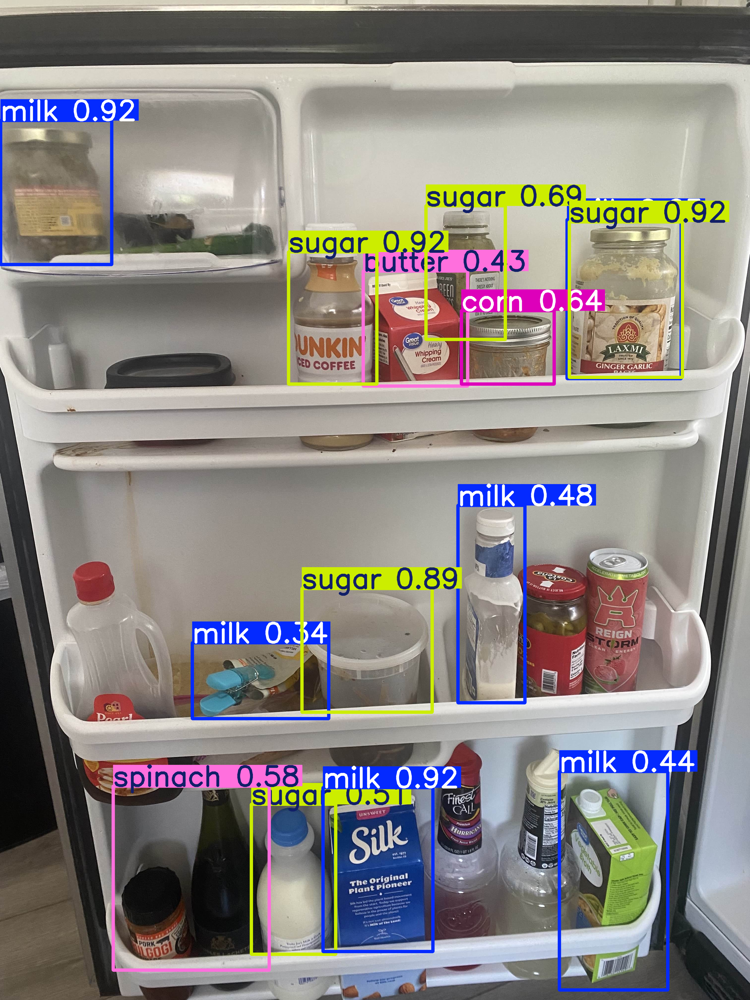

In [27]:
from PIL import Image
Image.fromarray(result.plot()[:,:,::-1])

In [3]:
reader = easyocr.Reader(['en'])

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [6]:
img = cv2.imread('test5.jpg')

# Convert to grayscale before passing to EasyOCR
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
results = reader.readtext(gray)

c:\Nandana\Projects\Summer 2025\yolo-detection\.venv\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


In [7]:
print(results)

[([[np.int32(1766), np.int32(1114)], [np.int32(1828), np.int32(1114)], [np.int32(1828), np.int32(1135)], [np.int32(1766), np.int32(1135)]], 'Keu vozy', np.float64(0.020750218416420975)), ([[np.int32(1911), np.int32(1111)], [np.int32(2003), np.int32(1111)], [np.int32(2003), np.int32(1144)], [np.int32(1911), np.int32(1144)]], 'Thees KoTFN5', np.float64(0.0972840811363141)), ([[np.int32(1754), np.int32(1131)], [np.int32(1839), np.int32(1131)], [np.int32(1839), np.int32(1206)], [np.int32(1754), np.int32(1206)]], 'SpFEL', np.float64(0.06608371414375733)), ([[np.int32(1671), np.int32(1211)], [np.int32(1714), np.int32(1211)], [np.int32(1714), np.int32(1226)], [np.int32(1671), np.int32(1226)]], 'Ncoo', np.float64(0.06571687757968903)), ([[np.int32(1633), np.int32(1222)], [np.int32(1749), np.int32(1222)], [np.int32(1749), np.int32(1264)], [np.int32(1633), np.int32(1264)]], 'whizper?', np.float64(0.265244817035797)), ([[np.int32(1913), np.int32(1248)], [np.int32(1992), np.int32(1248)], [np.int32